<h2>Klasifikasi Penyakit pada Citra Buah Mangga Menggunakan Ekstraksi Fitur Tekstur GLCM dengan Metode KNN, SVM, dan Random Forest</h2>
<h5>Nama Anggota</h5>
<p>Sobihatun Nufus : F1D02410024</p>
<p>Ni Komang Ayu Sumeitri : F1D02410084</p>
<p>Sri Zul'Aini Ulya : F1D02410096</p>

<h2>Tanpa Preprocessing</h2>

<h1>Import Library</h1>

In [2]:
import os
import cv2 as cv
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import numpy as np
import pandas as pd
from tqdm import tqdm
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from skimage.feature import graycomatrix, graycoprops
from scipy.stats import entropy
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import ConfusionMatrixDisplay
import seaborn as sns
from matplotlib.colors import LinearSegmentedColormap


<p style="text-align: justify;">
Code di atas digunakan untuk mengimpor berbagai library yang dibutuhkan dalam proyek Pengolahan Citra Digital (PCD). Library `os` digunakan untuk mengakses dan mengelola file maupun direktori yang berisi dataset citra. Library `cv2` dari OpenCV digunakan untuk membaca dan melakukan berbagai operasi pengolahan citra digital, sedangkan `numpy` digunakan untuk pengolahan data numerik dalam bentuk array. Library `pandas` digunakan untuk menyimpan dan mengelola data hasil ekstraksi fitur dalam bentuk DataFrame.

Visualisasi citra dan hasil pengolahan dilakukan menggunakan `matplotlib.pyplot` dan `seaborn`, yang digunakan untuk menampilkan gambar, grafik, heatmap, serta confusion matrix. Selain itu, `LinearSegmentedColormap` dari `matplotlib.colors` digunakan untuk membuat gradasi warna khusus pada visualisasinya.

Untuk proses ekstraksi fitur tekstur, digunakan `graycomatrix` dan `graycoprops` dari `skimage.feature` yang berfungsi untuk membentuk Gray Level Co-occurrence Matrix (GLCM) dan menghitung karakteristik tekstur citra. Library `entropy` dari `scipy.stats` digunakan untuk menghitung nilai entropi sebagai salah satu fitur tekstur yang dianalisis.

Library `train_test_split` dari `sklearn.model_selection` digunakan untuk membagi data menjadi data latih dan data uji. Proses klasifikasi dilakukan menggunakan algoritma `RandomForestClassifier`, `SVC`, dan `KNeighborsClassifier`. Evaluasi hasil klasifikasi dilakukan menggunakan `accuracy_score`, `classification_report`, `confusion_matrix`, dan `ConfusionMatrixDisplay`. Selain itu, library `tqdm` digunakan untuk menampilkan progress bar sehingga proses pengolahan data dapat dipantau dengan lebih mudah.
</p>

<h1>Data Loading</h1>

In [3]:
def insertGambar(folder):
    data = []
    filenames = []
    datalabel = []
    path = []
    data_distribution = {}
    for label in sorted(os.listdir(folder)):
        label_path = os.path.join(folder, label)
        if not os.path.isdir(label_path):
            continue
        images_list = os.listdir(label_path)
        data_distribution[label] = len(images_list)
        datalabel.append(label)
        print(f"Memuat kelas: {label} ({len(images_list)} citra)")
        count = 0
        for filename in tqdm(images_list):
            if count == 100:
                break
            img = cv.imread(os.path.join(label_path, filename))
            if img is not None:
                img = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
                filenames.append(filename)
                path.append(label)
                data.append(img)
                count += 1
    return data, filenames, datalabel, path, data_distribution

<p style="text-align: justify;">
Code di atas digunakan untuk memuat dan membaca gambar dari struktur folder dataset. Fungsi insertGambar(folder) melakukan iterasi terhadap setiap subfolder dalam direktori dataset, yang masing-masing dianggap sebagai kelas label. Setiap gambar dibaca menggunakan cv.imread, kemudian dikonversi dari format BGR (default OpenCV) ke grayscale menggunakan cv.cvtColor agar citra berada dalam satu channel intensitas.

Fungsi ini membatasi jumlah gambar yang dimuat dari setiap kelas hingga 100 gambar untuk menjaga keseimbangan data serta mengontrol ukuran dataset selama tahap pengembangan. Setiap gambar yang berhasil dimuat disimpan ke dalam list data, nama file disimpan pada filenames, dan label kelas dari setiap gambar disimpan pada path. Selain itu, data_distribution digunakan untuk mencatat jumlah gambar pada setiap kelas, sedangkan datalabel menyimpan daftar nama kelas yang tersedia dalam dataset. Fungsi ini mengembalikan data citra, nama file, daftar kelas, label setiap citra, serta distribusi jumlah citra per kelas.
</p>

In [4]:
images, filenames, labels, path, distribusi = insertGambar("dataset/")

print("\nJumlah gambar      :", len(images))
print("Jumlah label unik  :", len(labels))
print("Jumlah nama file   :", len(filenames))
print("Distribusi data    :", distribusi)

Memuat kelas: Alternaria (100 citra)


100%|██████████| 100/100 [00:00<00:00, 363.82it/s]


Memuat kelas: Anthracnose (100 citra)


100%|██████████| 100/100 [00:00<00:00, 439.34it/s]


Memuat kelas: Healthy (100 citra)


100%|██████████| 100/100 [00:00<00:00, 540.87it/s]


Memuat kelas: Stem and Rot (100 citra)


100%|██████████| 100/100 [00:00<00:00, 430.19it/s]


Jumlah gambar      : 400
Jumlah label unik  : 4
Jumlah nama file   : 400
Distribusi data    : {'Alternaria': 100, 'Anthracnose': 100, 'Healthy': 100, 'Stem and Rot': 100}


<p style="text-align: justify;">
Code di atas digunakan untuk menjalankan fungsi insertGambar() pada folder dataset bernama "dataset/". Fungsi tersebut bertugas memuat citra dari empat kelas yaitu Alternaria, Anthracnose, Healthy, dan Stean and Rot, dengan pembatasan maksimal 100 gambar pada setiap kelas. Hasil dari fungsi ini dikembalikan dalam lima variabel, yaitu images yang berisi data citra, filenames yang berisi nama file gambar, labels yang berisi daftar nama kelas, path yang berisi label kelas untuk setiap gambar, serta distribusi yang berisi jumlah citra pada masing-masing kelas.

Output yang ditampilkan menunjukkan bahwa total 400 gambar berhasil dimuat dari seluruh kelas. Setiap kelas memiliki 100 gambar, sehingga distribusi data menjadi seimbang. Jumlah label unik yang terdeteksi adalah 4, sesuai dengan jumlah subfolder pada dataset, dan jumlah nama file yang terbaca adalah 400. Proses pemuatan citra ditampilkan menggunakan tqdm sebagai indikator progres selama pembacaan dataset berlangsung.
</p>

<h1>Data Understanding</h1>

<p style="text-align: justify;">
Code di bawah digunakan untuk memvisualisasikan distribusi jumlah citra pada setiap kelas dalam dataset penyakit buah mangga menggunakan diagram batang (bar chart). Data yang digunakan diperoleh dari variabel distribusi, di mana label kelas diambil dari key dictionary dan jumlah citra diambil dari value masing-masing kelas.

Visualisasi dibuat menggunakan library Matplotlib dengan fungsi bar chart, yang menampilkan setiap kelas pada sumbu X dan jumlah citra pada sumbu Y. Grafik diberi judul "Distribusi Dataset Penyakit Buah Mangga" dengan penambahan label pada sumbu X sebagai "Kelas Penyakit" dan sumbu Y sebagai "Jumlah Citra". Warna batang pada grafik diatur menggunakan kombinasi warna berbeda untuk setiap kelas agar tampilan visual lebih informatif dan mudah dibedakan. Pengaturan layout dilakukan menggunakan tight_layout() agar elemen grafik tidak saling bertumpukan, kemudian hasil visualisasi ditampilkan menggunakan plt.show().
</p>

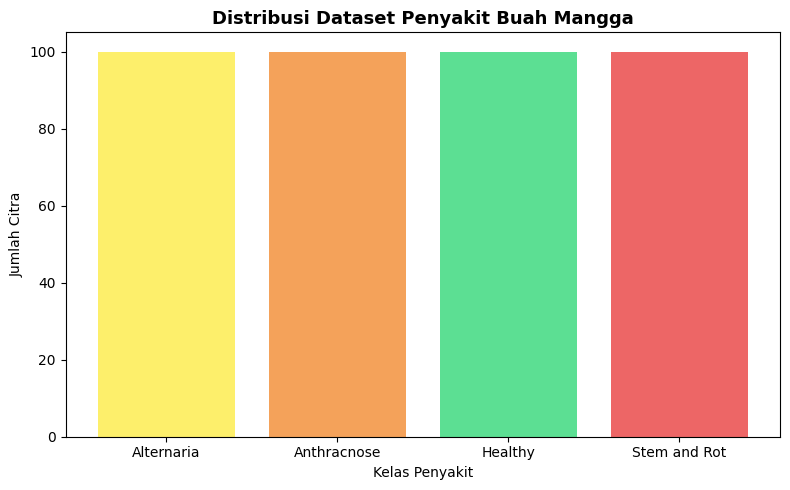

In [5]:
label_names = list(distribusi.keys())
jumlah = list(distribusi.values())

plt.figure(figsize=(8, 5))
bars = plt.bar(label_names, jumlah, color=["#fdef6b", "#f4a25a", "#5cdf93", "#ed6666"])

plt.title("Distribusi Dataset Penyakit Buah Mangga", fontsize=13, fontweight='bold')
plt.xlabel("Kelas Penyakit")
plt.ylabel("Jumlah Citra")
plt.tight_layout()
plt.show()

<h1>Menampilkan Dataset</h1>

<p style="text-align: justify;">
Code di bawah digunakan untuk menampilkan visualisasi citra dalam dataset berdasarkan kelasnya dalam bentuk grid. Fungsi tampilkan_per_kelas(images_list, path_list) memisahkan citra berdasarkan label kelas yang terdapat pada variabel path_list, kemudian setiap kelas ditampilkan secara terpisah.

Setiap citra divisualisasikan menggunakan Matplotlib dengan skema grayscale (cmap='gray') dan disusun dalam bentuk grid menggunakan GridSpec. Jumlah kolom pada grid ditetapkan sebanyak 20 citra per baris, sedangkan jumlah baris disesuaikan secara otomatis berdasarkan jumlah citra pada setiap kelas.

Untuk setiap kelas, ditambahkan judul yang menampilkan nama kelas pada bagian atas grid. Sumbu pada setiap subplot dihilangkan agar tampilan lebih bersih dan fokus hanya pada citra. Jika terdapat subplot yang tidak terisi karena jumlah citra tidak habis dibagi jumlah kolom, maka area tersebut tetap dikosongkan secara otomatis oleh GridSpec. Hasil akhir visualisasi ditampilkan menggunakan plt.show().
</p>

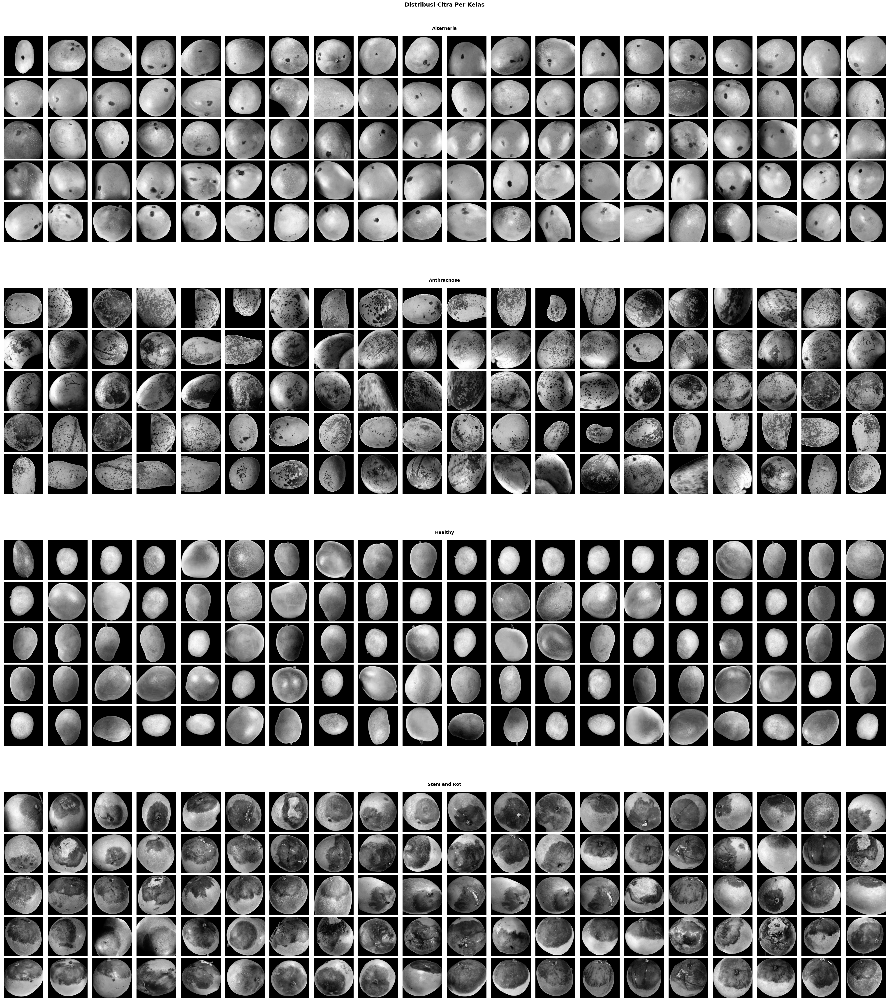

In [6]:
def tampilkan_per_kelas(images_list, path_list, title="Distribusi Citra per Kelas"):
    sorted_labels = sorted(set(path_list))
    cols = 20

    fig = plt.figure(figsize=(40, 45))
    fig.suptitle(title, fontsize=18, fontweight='bold', y=0.99)

    outer_gs = gridspec.GridSpec(len(sorted_labels), 1, figure=fig, hspace=0.15,
                                 top=0.97, bottom=0.01, left=0.01, right=0.99)

    for class_idx, label in enumerate(sorted_labels):
        imgs = [img for img, p in zip(images_list, path_list) if p == label]
        num_images = len(imgs)
        img_rows = (num_images // cols) + (1 if num_images % cols else 0)

        inner_gs = gridspec.GridSpecFromSubplotSpec(
            img_rows + 1, cols,
            subplot_spec=outer_gs[class_idx],
            hspace=0.05, wspace=0.05,
            height_ratios=[0.3] + [1] * img_rows
        )

        ax_title = fig.add_subplot(inner_gs[0, :])
        ax_title.set_facecolor('#f0f0f0')
        ax_title.text(0.5, 0.5, label, fontsize=14, fontweight='bold',
                      ha='center', va='center', transform=ax_title.transAxes)
        ax_title.axis('off')

        for i, img in enumerate(imgs):
            ax = fig.add_subplot(inner_gs[1 + i // cols, i % cols])
            ax.imshow(img, cmap='gray')
            ax.axis('off')

    plt.show()

tampilkan_per_kelas(images, path, title="Distribusi Citra Per Kelas")

<h1>Feature Extraction Gray Level Co-occurrence Matrix (GLCM)</h1>

In [7]:
def glcm(image, derajat):
    if derajat == 0:
        angles = [0]
    elif derajat == 45:
        angles = [np.pi / 4]
    elif derajat == 90:
        angles = [np.pi / 2]
    elif derajat == 135:
        angles = [3 * np.pi / 4]
    else:
        raise ValueError("Sudut harus salah satu dari: 0, 45, 90, 135.")
    glcm_mat = graycomatrix(image, [1], angles, 256, symmetric=True, normed=True)
    return glcm_mat

<p style="text-align: justify;">
Code di atas digunakan untuk membuat fungsi glcm yang bertugas menghitung matriks Gray Level Co-occurrence Matrix (GLCM) dari citra grayscale berdasarkan sudut tertentu. Parameter derajat digunakan untuk menentukan arah perhitungan yang hanya dapat bernilai 0, 45, 90, atau 135 derajat.

Nilai sudut tersebut kemudian dikonversi ke dalam bentuk radian karena fungsi graycomatrix dari library skimage.feature menggunakan input sudut dalam satuan radian. Setiap nilai derajat dipetakan ke sudut yang sesuai, yaitu 0° menjadi 0 radian, 45° menjadi π/4, 90° menjadi π/2, dan 135° menjadi 3π/4.

Fungsi graycomatrix dipanggil dengan parameter jarak piksel sebesar 1, jumlah level intensitas 256, serta pengaturan symmetric=True dan normed=True agar matriks yang dihasilkan bersifat simetris dan ternormalisasi. Jika nilai derajat yang dimasukkan tidak sesuai dengan ketentuan, maka fungsi akan menghasilkan error untuk memastikan input yang digunakan valid.
</p>

In [8]:
def correlation_feat(m): 
    return graycoprops(m, 'correlation')[0, 0]

<p style="text-align: justify;">
Code di atas digunakan untuk mendefinisikan fungsi correlation_feat yang berfungsi untuk mengekstrak nilai fitur korelasi dari matriks Gray Level Co-occurrence Matrix (GLCM). Fungsi ini memanfaatkan graycoprops dari library skimage.feature dengan parameter 'correlation' untuk memperoleh nilai korelasi dari matriks GLCM yang diberikan sebagai input.

Nilai korelasi yang dihasilkan merepresentasikan hubungan linear antara intensitas pasangan piksel pada citra. Fungsi ini mengembalikan satu nilai numerik yang diambil dari hasil perhitungan graycoprops, tepatnya pada indeks [0, 0] dari matriks output.
</p>

In [9]:
def dissimilarity_feat(m): 
    return graycoprops(m, 'dissimilarity')[0, 0]

<p style="text-align: justify;">
Code di atas digunakan untuk mendefinisikan fungsi dissimilarity_feat yang berfungsi untuk mengekstrak fitur dissimilarity dari matriks Gray Level Co-occurrence Matrix (GLCM). Fungsi ini menggunakan graycoprops dari library skimage.feature dengan parameter 'dissimilarity' untuk memperoleh nilai ketidaksamaan dari pasangan piksel pada citra.

Fitur dissimilarity menggambarkan tingkat perbedaan intensitas antara pasangan piksel yang berdekatan dalam citra. Semakin besar nilai dissimilarity, semakin tinggi perbedaan intensitas antar piksel. Fungsi ini mengembalikan satu nilai numerik yang diambil dari hasil perhitungan graycoprops pada indeks [0, 0].
</p>

In [10]:
def homogenity_feat(m): 
    return graycoprops(m, 'homogeneity')[0, 0]

<p style="text-align: justify;">
Code di atas digunakan untuk mendefinisikan fungsi homogeneity_feat yang berfungsi untuk mengekstrak fitur homogeneity dari matriks Gray Level Co-occurrence Matrix (GLCM). Fungsi ini menggunakan graycoprops dari library skimage.feature dengan parameter 'homogeneity' untuk memperoleh nilai homogenitas dari pasangan piksel pada citra.

Fitur homogeneity menggambarkan tingkat keseragaman atau konsistensi tekstur dalam citra. Semakin tinggi nilai homogeneity, maka semakin seragam pola intensitas piksel pada citra tersebut. Fungsi ini mengembalikan satu nilai numerik yang diambil dari hasil perhitungan graycoprops pada indeks [0, 0].
</p>

In [11]:
def contrast_feat(m): 
    return graycoprops(m, 'contrast')[0, 0]

<p style="text-align: justify;">
Code di atas digunakan untuk mendefinisikan fungsi contrast_feat yang berfungsi untuk mengekstrak fitur contrast dari matriks Gray Level Co-occurrence Matrix (GLCM). Fungsi ini menggunakan graycoprops dari library skimage.feature dengan parameter 'contrast' untuk memperoleh nilai kontras dari pasangan piksel pada citra.

Fitur contrast mengukur tingkat variasi intensitas antara piksel yang berdekatan dalam citra. Semakin tinggi nilai contrast, semakin besar perbedaan intensitas antar piksel sehingga tekstur citra cenderung lebih kasar atau memiliki variasi yang tinggi. Fungsi ini mengembalikan satu nilai numerik yang merepresentasikan tingkat kontras tekstur berdasarkan hasil perhitungan graycoprops pada indeks [0, 0].
</p>

In [12]:
def ASM_feat(m): 
    return graycoprops(m, 'ASM')[0, 0]

<p style="text-align: justify;">
Code di atas digunakan untuk mendefinisikan fungsi ASM_feat yang berfungsi untuk mengekstrak fitur Angular Second Moment (ASM) dari matriks Gray Level Co-occurrence Matrix (GLCM). Fungsi ini menggunakan graycoprops dari library skimage.feature dengan parameter 'ASM' untuk memperoleh nilai ASM dari pasangan piksel pada citra.

ASM menggambarkan tingkat keteraturan atau homogenitas tekstur dalam citra, di mana nilai ASM yang tinggi menunjukkan bahwa pola intensitas piksel lebih seragam dan teratur. Fungsi ini mengembalikan satu nilai numerik yang merepresentasikan tingkat keteraturan tekstur berdasarkan hasil perhitungan graycoprops pada indeks [0, 0].
</p>

In [13]:
def energy_feat(m): 
    return graycoprops(m, 'energy')[0, 0]

<p style="text-align: justify;">
Code di atas digunakan untuk mendefinisikan fungsi energy_feat yang berfungsi untuk mengekstrak fitur energy dari matriks Gray Level Co-occurrence Matrix (GLCM). Fungsi ini menggunakan graycoprops dari library skimage.feature dengan parameter 'energy' untuk memperoleh nilai energy dari pasangan piksel pada citra.

Fitur energy menggambarkan tingkat keseragaman atau konsentrasi distribusi nilai pada citra. Semakin tinggi nilai energy, maka tekstur citra semakin homogen dan memiliki pola intensitas yang lebih teratur. Fungsi ini mengembalikan satu nilai numerik yang merepresentasikan karakteristik tekstur citra berdasarkan hasil perhitungan graycoprops pada indeks [0, 0].
</p>

In [14]:
def entropy_feat(m): 
    return entropy(m.ravel())

<p style="text-align: justify;">
Code di atas digunakan untuk mendefinisikan fungsi entropy_feat yang berfungsi untuk menghitung nilai entropi dari matriks Gray Level Co-occurrence Matrix (GLCM). Fungsi ini menggunakan entropy dari library scipy.stats untuk mengukur tingkat ketidakteraturan atau kompleksitas data pada matriks GLCM.

Sebelum proses perhitungan, matriks GLCM diubah menjadi array satu dimensi menggunakan fungsi ravel() agar seluruh elemen dapat dihitung sebagai satu distribusi nilai. Nilai entropi yang dihasilkan menggambarkan tingkat kompleksitas tekstur citra, di mana nilai yang lebih tinggi menunjukkan tekstur yang lebih acak dan tidak teratur. Fungsi ini mengembalikan satu nilai numerik sebagai representasi tingkat entropi dari matriks GLCM.
</p>

In [15]:
Derajat0 = [] 
Derajat45 = [] 
Derajat90 = [] 
Derajat135 = []

print("Menghitung matriks GLCM...")
dataPreprocessed = images.copy()
for i in tqdm(range(len(dataPreprocessed))):
    D0 = glcm(dataPreprocessed[i], 0)
    D45 = glcm(dataPreprocessed[i], 45)
    D90 = glcm(dataPreprocessed[i], 90)
    D135 = glcm(dataPreprocessed[i], 135)
    Derajat0.append(D0)
    Derajat45.append(D45)
    Derajat90.append(D90)
    Derajat135.append(D135)
print("Proses perhitungan selesai!")


Menghitung matriks GLCM...


100%|██████████| 400/400 [00:00<00:00, 513.30it/s]

Proses perhitungan selesai!


<p style="text-align: justify;">
Code di atas digunakan untuk menghasilkan matriks Gray Level Co-occurrence Matrix (GLCM) dari setiap citra pada dataset berdasarkan empat orientasi sudut, yaitu 0°, 45°, 90°, dan 135°. Pada setiap iterasi, fungsi glcm() dipanggil dengan citra dan nilai sudut tertentu, kemudian hasil matriks GLCM tersebut disimpan ke dalam list sesuai dengan masing-masing derajat.

Proses ini dilakukan untuk memperoleh empat set matriks GLCM dari setiap citra, sehingga dapat digunakan untuk analisis dan ekstraksi fitur tekstur berdasarkan berbagai arah orientasi. Dengan adanya variasi sudut ini, informasi tekstur citra dapat direpresentasikan secara lebih lengkap.
</p>

In [16]:
Kontras0, Kontras45, Kontras90, Kontras135 = [], [], [], []
dissimilarity0, dissimilarity45, dissimilarity90, dissimilarity135 = [], [], [], []
homogenity0, homogenity45, homogenity90, homogenity135 = [], [], [], []
entropy0, entropy45, entropy90, entropy135 = [], [], [], []
ASM0, ASM45, ASM90, ASM135 = [], [], [], []
energy0, energy45, energy90, energy135 = [], [], [], []
correlation0, correlation45, correlation90, correlation135 = [], [], [], []

<p style="text-align: justify;">
Code di atas digunakan untuk mendefinisikan beberapa list kosong yang akan digunakan sebagai wadah penyimpanan fitur-fitur tekstur hasil ekstraksi dari matriks Gray Level Co-occurrence Matrix (GLCM) pada masing-masing orientasi sudut, yaitu 0°, 45°, 90°, dan 135°.

Fitur yang disiapkan meliputi contrast, dissimilarity, homogeneity, entropy, Angular Second Moment (ASM), energy, dan correlation. Setiap fitur memiliki empat list terpisah sesuai dengan arah sudutnya, sehingga memungkinkan penyimpanan nilai fitur secara terstruktur berdasarkan orientasi GLCM.

List-list ini nantinya digunakan untuk menampung hasil perhitungan fitur dari setiap citra sebelum dilakukan proses pengolahan lebih lanjut seperti pembentukan dataset fitur.
</p>

In [17]:
print("Mengekstraksi fitur dari GLCM...")

for i in tqdm(range(len(dataPreprocessed))):
    Kontras0.append(contrast_feat(Derajat0[i]))
    Kontras45.append(contrast_feat(Derajat45[i]))
    Kontras90.append(contrast_feat(Derajat90[i]))
    Kontras135.append(contrast_feat(Derajat135[i]))
print("Kontras selesai!")

Mengekstraksi fitur dari GLCM...


100%|██████████| 400/400 [00:00<00:00, 824.34it/s]

Kontras selesai!


<p style="text-align: justify;">
Code di atas digunakan untuk melakukan ekstraksi fitur contrast dari matriks Gray Level Co-occurrence Matrix (GLCM) pada empat orientasi sudut, yaitu 0°, 45°, 90°, dan 135° untuk setiap citra dalam dataset.

Proses ekstraksi dilakukan dengan memanggil fungsi contrast_feat() pada masing-masing matriks GLCM sesuai orientasi. Nilai contrast yang dihasilkan menggambarkan tingkat perbedaan intensitas antara piksel yang berdekatan dalam citra, di mana nilai yang lebih tinggi menunjukkan variasi tekstur yang lebih besar atau lebih kasar.

Setiap hasil ekstraksi disimpan ke dalam list terpisah berdasarkan sudut, yaitu Kontras0, Kontras45, Kontras90, dan Kontras135. Data ini kemudian akan digunakan bersama fitur tekstur lainnya pada tahap pembentukan dataset fitur.
</p>

In [18]:
for i in tqdm(range(len(dataPreprocessed))):
    dissimilarity0.append(dissimilarity_feat(Derajat0[i]))
    dissimilarity45.append(dissimilarity_feat(Derajat45[i]))
    dissimilarity90.append(dissimilarity_feat(Derajat90[i]))
    dissimilarity135.append(dissimilarity_feat(Derajat135[i]))
print("Dissimilarity selesai!")

100%|██████████| 400/400 [00:00<00:00, 629.99it/s]

Dissimilarity selesai!


<p style="text-align: justify;">
Code di atas digunakan untuk melakukan ekstraksi fitur dissimilarity dari matriks Gray Level Co-occurrence Matrix (GLCM) pada empat orientasi sudut, yaitu 0°, 45°, 90°, dan 135° untuk setiap citra dalam dataset.

Fitur dissimilarity menggambarkan tingkat ketidaksamaan intensitas antara pasangan piksel yang berdekatan dalam citra, di mana nilai yang lebih besar menunjukkan perbedaan tekstur yang semakin tinggi.

Proses ekstraksi dilakukan dengan memanggil fungsi dissimilarity_feat() pada masing-masing matriks GLCM sesuai orientasi sudut. Hasil perhitungan kemudian disimpan ke dalam list terpisah, yaitu dissimilarity0, dissimilarity45, dissimilarity90, dan dissimilarity135. Data ini selanjutnya digunakan sebagai bagian dari fitur tekstur dalam proses analisis citra.
</p>

In [19]:
for i in tqdm(range(len(dataPreprocessed))):
    homogenity0.append(homogenity_feat(Derajat0[i]))
    homogenity45.append(homogenity_feat(Derajat45[i]))
    homogenity90.append(homogenity_feat(Derajat90[i]))
    homogenity135.append(homogenity_feat(Derajat135[i]))
print("Homogenity selesai!")

100%|██████████| 400/400 [00:00<00:00, 771.00it/s]

Homogenity selesai!


<p style="text-align: justify;">
Code di atas digunakan untuk melakukan ekstraksi fitur homogeneity dari matriks Gray Level Co-occurrence Matrix (GLCM) pada empat orientasi sudut, yaitu 0°, 45°, 90°, dan 135° untuk setiap citra dalam dataset.

Fitur homogeneity menggambarkan tingkat keseragaman atau konsistensi distribusi intensitas piksel dalam citra, di mana nilai yang lebih tinggi menunjukkan tekstur yang lebih seragam.

Proses ekstraksi dilakukan dengan memanggil fungsi homogeneity_feat() pada masing-masing matriks GLCM sesuai orientasi sudut. Hasil perhitungan kemudian disimpan ke dalam list terpisah, yaitu homogeneity0, homogeneity45, homogeneity90, dan homogeneity135. Data ini selanjutnya digunakan sebagai bagian dari representasi fitur tekstur citra.
</p>

In [20]:
for i in tqdm(range(len(dataPreprocessed))):
    entropy0.append(entropy_feat(Derajat0[i]))
    entropy45.append(entropy_feat(Derajat45[i]))
    entropy90.append(entropy_feat(Derajat90[i]))
    entropy135.append(entropy_feat(Derajat135[i]))
print("Entropy selesai!")

100%|██████████| 400/400 [00:01<00:00, 264.25it/s]

Entropy selesai!


<p style="text-align: justify;">
Code di atas digunakan untuk melakukan ekstraksi fitur entropy dari matriks Gray Level Co-occurrence Matrix (GLCM) pada empat orientasi sudut, yaitu 0°, 45°, 90°, dan 135° untuk setiap citra dalam dataset.

Fitur entropy menggambarkan tingkat ketidakaturan atau kompleksitas tekstur dalam citra, di mana nilai yang lebih tinggi menunjukkan tekstur yang lebih acak dan tidak terstruktur.

Proses ekstraksi dilakukan dengan memanggil fungsi entropy_feat() pada masing-masing matriks GLCM sesuai orientasi sudut. Nilai entropi dihitung dengan meratakan matriks GLCM menjadi array satu dimensi sebelum dilakukan perhitungan menggunakan fungsi entropy dari library scipy.stats. Hasil ekstraksi kemudian disimpan ke dalam list terpisah, yaitu entropy0, entropy45, entropy90, dan entropy135 sebagai bagian dari representasi fitur tekstur citra.
</p>

In [21]:
for i in tqdm(range(len(dataPreprocessed))):
    ASM0.append(ASM_feat(Derajat0[i]))
    ASM45.append(ASM_feat(Derajat45[i]))
    ASM90.append(ASM_feat(Derajat90[i]))
    ASM135.append(ASM_feat(Derajat135[i]))
print("ASM selesai!")

100%|██████████| 400/400 [00:00<00:00, 1317.52it/s]

ASM selesai!


<p style="text-align: justify;">
Code di atas digunakan untuk melakukan ekstraksi fitur Angular Second Moment (ASM) dari matriks Gray Level Co-occurrence Matrix (GLCM) pada empat orientasi sudut, yaitu 0°, 45°, 90°, dan 135° untuk setiap citra dalam dataset.

Fitur ASM menggambarkan tingkat homogenitas atau keteraturan tekstur dalam citra, di mana nilai yang lebih tinggi menunjukkan pola intensitas piksel yang lebih seragam.

Proses ekstraksi dilakukan dengan memanggil fungsi ASM_feat() pada masing-masing matriks GLCM sesuai orientasi sudut. Hasil perhitungan kemudian disimpan ke dalam list terpisah, yaitu ASM0, ASM45, ASM90, dan ASM135 sebagai bagian dari representasi fitur tekstur citra.
</p>

In [22]:
for i in tqdm(range(len(dataPreprocessed))):
    energy0.append(energy_feat(Derajat0[i]))
    energy45.append(energy_feat(Derajat45[i]))
    energy90.append(energy_feat(Derajat90[i]))
    energy135.append(energy_feat(Derajat135[i]))
print("Energy selesai!")

100%|██████████| 400/400 [00:00<00:00, 1482.64it/s]

Energy selesai!


<p style="text-align: justify;">
Code di atas digunakan untuk melakukan ekstraksi fitur energy dari matriks Gray Level Co-occurrence Matrix (GLCM) pada empat orientasi sudut, yaitu 0°, 45°, 90°, dan 135° untuk setiap citra dalam dataset.

Fitur energy menggambarkan tingkat keseragaman atau kekompakan distribusi intensitas piksel dalam citra, di mana nilai yang lebih tinggi menunjukkan tekstur yang lebih halus dan teratur.

Proses ekstraksi dilakukan dengan memanggil fungsi energy_feat() pada masing-masing matriks GLCM sesuai orientasi sudut. Hasil perhitungan kemudian disimpan ke dalam list terpisah, yaitu energy0, energy45, energy90, dan energy135 sebagai bagian dari representasi fitur tekstur citra.
</p>

In [23]:
for i in tqdm(range(len(dataPreprocessed))):
    correlation0.append(correlation_feat(Derajat0[i]))
    correlation45.append(correlation_feat(Derajat45[i]))
    correlation90.append(correlation_feat(Derajat90[i]))
    correlation135.append(correlation_feat(Derajat135[i]))
print("Correlation selesai!")

print("Ekstraksi fitur selesai!")

100%|██████████| 400/400 [00:00<00:00, 498.18it/s]

Correlation selesai!
Ekstraksi fitur selesai!


<p style="text-align: justify;">
Code di atas digunakan untuk melakukan ekstraksi fitur correlation dari matriks Gray Level Co-occurrence Matrix (GLCM) yang telah dihitung sebelumnya pada empat orientasi sudut, yaitu 0°, 45°, 90°, dan 135° untuk setiap citra dalam dataset.

Fitur correlation menggambarkan tingkat hubungan linear antara pasangan piksel dalam citra, di mana nilai ini menunjukkan seberapa kuat keterkaitan intensitas antar piksel pada suatu arah tertentu.

Proses ekstraksi dilakukan dengan memanggil fungsi correlation_feat() pada masing-masing matriks GLCM sesuai orientasi sudut. Hasil perhitungan kemudian disimpan ke dalam list terpisah, yaitu correlation0, correlation45, correlation90, dan correlation135 sebagai bagian dari representasi fitur tekstur citra.

Setelah seluruh proses ekstraksi fitur selesai dilakukan, sistem menampilkan pesan bahwa proses ekstraksi fitur telah selesai.
</p>

In [24]:
print("Verifikasi jumlah data:")
print(f"  Labels        : {len(path)}")
print(f"  Filenames     : {len(filenames)}")
print(f"  Contrast      : {len(Kontras0)}, {len(Kontras45)}, {len(Kontras90)}, {len(Kontras135)}")
print(f"  Dissimilarity : {len(dissimilarity0)}, {len(dissimilarity45)}, {len(dissimilarity90)}, {len(dissimilarity135)}")
print(f"  Homogenity    : {len(homogenity0)}, {len(homogenity45)}, {len(homogenity90)}, {len(homogenity135)}")
print(f"  Entropy       : {len(entropy0)}, {len(entropy45)}, {len(entropy90)}, {len(entropy135)}")
print(f"  ASM           : {len(ASM0)}, {len(ASM45)}, {len(ASM90)}, {len(ASM135)}")
print(f"  Energy        : {len(energy0)}, {len(energy45)}, {len(energy90)}, {len(energy135)}")
print(f"  Correlation   : {len(correlation0)}, {len(correlation45)}, {len(correlation90)}, {len(correlation135)}")

Verifikasi jumlah data:
  Labels        : 400
  Filenames     : 400
  Contrast      : 400, 400, 400, 400
  Dissimilarity : 400, 400, 400, 400
  Homogenity    : 400, 400, 400, 400
  Entropy       : 400, 400, 400, 400
  ASM           : 400, 400, 400, 400
  Energy        : 400, 400, 400, 400
  Correlation   : 400, 400, 400, 400


<p style="text-align: justify;">
Code di atas digunakan untuk melakukan verifikasi jumlah data hasil proses ekstraksi fitur yang telah dilakukan. Verifikasi ini bertujuan untuk memastikan bahwa setiap fitur memiliki jumlah data yang sama dengan jumlah citra yang telah diproses, sehingga tidak terjadi ketidaksesuaian atau missing data pada tahap pembentukan dataset.

Pemeriksaan dilakukan dengan membandingkan jumlah elemen pada setiap list, termasuk labels (path) dan filenames, serta seluruh fitur tekstur yang telah diekstraksi dari matriks Gray Level Co-occurrence Matrix (GLCM), yaitu contrast, dissimilarity, homogeneity, entropy, Angular Second Moment (ASM), energy, dan correlation pada empat orientasi sudut (0°, 45°, 90°, dan 135°).

Hasil verifikasi ini memastikan bahwa seluruh fitur memiliki jumlah data yang konsisten sebelum digunakan pada tahap pengolahan data berikutnya.
</p>

<h1>Write the extraction's results to CSV</h1>

In [25]:
dataTable = {
    'Filename': filenames, 'Label': path,
    'Contrast0': Kontras0, 'Contrast45': Kontras45, 'Contrast90': Kontras90, 'Contrast135': Kontras135,
    'Homogeneity0': homogenity0, 'Homogeneity45': homogenity45, 'Homogeneity90': homogenity90, 'Homogeneity135': homogenity135,
    'Dissimilarity0': dissimilarity0, 'Dissimilarity45': dissimilarity45, 'Dissimilarity90': dissimilarity90, 'Dissimilarity135': dissimilarity135,
    'Entropy0': entropy0, 'Entropy45': entropy45, 'Entropy90': entropy90, 'Entropy135': entropy135,
    'ASM0': ASM0, 'ASM45': ASM45, 'ASM90': ASM90, 'ASM135': ASM135,
    'Energy0': energy0, 'Energy45': energy45, 'Energy90': energy90, 'Energy135': energy135,
    'Correlation0': correlation0, 'Correlation45': correlation45, 'Correlation90': correlation90, 'Correlation135': correlation135,
}

df = pd.DataFrame(dataTable)
df.to_csv('hasil_ekstraksi_baseline.csv', index=False)

hasilEkstrak = pd.read_csv('hasil_ekstraksi_baseline.csv')
print(f"CSV tersimpan: {hasilEkstrak.shape[0]} baris, {hasilEkstrak.shape[1]} kolom")
hasilEkstrak

CSV tersimpan: 400 baris, 30 kolom


,Filename,Label,Contrast0,Contrast45,Contrast90,Contrast135,Homogeneity0,Homogeneity45,Homogeneity90,Homogeneity135,...,ASM90,ASM135,Energy0,Energy45,Energy90,Energy135,Correlation0,Correlation45,Correlation90,Correlation135
0,Alternaria_006.jpg,Alternaria,45.653267,63.274307,24.316944,59.718756,0.818982,0.793431,0.848952,0.798346,...,0.432621,0.427757,0.656174,0.653766,0.657739,0.654031,0.992095,0.989070,0.995790,0.989684
1,Alternaria_009.jpg,Alternaria,55.135490,116.460657,73.463925,107.679905,0.527417,0.475227,0.502240,0.475130,...,0.122626,0.120419,0.352229,0.346655,0.350180,0.347014,0.993341,0.985900,0.991121,0.986963
2,Alternaria_010.jpg,Alternaria,41.736147,72.450964,60.575833,105.944017,0.534703,0.494080,0.536885,0.488757,...,0.116766,0.113840,0.343071,0.338472,0.341711,0.337402,0.993824,0.989246,0.991033,0.984274
3,Alternaria_011.jpg,Alternaria,40.197710,76.988276,48.149383,79.180518,0.557114,0.511596,0.563235,0.513245,...,0.132037,0.128710,0.363295,0.358252,0.363369,0.358761,0.993759,0.988022,0.992525,0.987681
4,Alternaria_014.jpg,Alternaria,55.485866,148.303927,87.458800,95.663818,0.557544,0.494284,0.567409,0.500657,...,0.073540,0.072229,0.272960,0.267616,0.271182,0.268755,0.992944,0.981085,0.988887,0.987799
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
395,Lasiodiplodia_153.jpg,Stem and Rot,99.729260,176.483139,113.759329,185.462768,0.441186,0.393184,0.431704,0.391457,...,0.069235,0.066658,0.263144,0.257484,0.263126,0.258182,0.979358,0.963399,0.976455,0.961537
396,Lasiodiplodia_154.jpg,Stem and Rot,76.071409,119.099841,50.978279,97.485773,0.367333,0.327310,0.382288,0.326456,...,0.029276,0.027531,0.168693,0.165879,0.171104,0.165925,0.980396,0.969193,0.986900,0.974784
397,Lasiodiplodia_155.jpg,Stem and Rot,41.387592,91.261135,53.191384,75.434153,0.492001,0.422848,0.480502,0.424240,...,0.049543,0.047992,0.224500,0.219351,0.222583,0.219071,0.993694,0.986068,0.991893,0.988484
398,Lasiodiplodia_156.jpg,Stem and Rot,100.164958,131.698365,91.234105,193.743047,0.431263,0.397021,0.442965,0.397678,...,0.074543,0.071655,0.271245,0.267817,0.273025,0.267684,0.978236,0.971362,0.980187,0.957870


<p style="text-align: justify;">
Code di atas digunakan untuk menyusun seluruh fitur hasil ekstraksi citra ke dalam bentuk tabel menggunakan struktur DataFrame dari library pandas. Fitur-fitur tekstur yang terdiri dari contrast, homogeneity, dissimilarity, entropy, Angular Second Moment (ASM), energy, dan correlation pada empat orientasi sudut (0°, 45°, 90°, dan 135°) digabungkan bersama informasi nama file (Filename) dan label kelas (Label) ke dalam sebuah dictionary dataTable.

Dictionary tersebut kemudian dikonversi menjadi DataFrame untuk membentuk dataset terstruktur yang siap digunakan pada tahap analisis selanjutnya. Setelah itu, DataFrame disimpan ke dalam file CSV dengan nama hasil_ekstraksi_baseline.csv sebagai bentuk penyimpanan data fitur.

Untuk memastikan hasil penyimpanan, file CSV tersebut kemudian dibaca kembali ke dalam variabel hasilEkstrak menggunakan pandas. Proses ini juga berfungsi sebagai validasi bahwa jumlah data yang tersimpan sesuai dengan jumlah fitur yang telah diekstraksi sebelumnya.
</p>

<h1>Feature Selection Correlation</h1>

<p style="text-align: justify;">
Code di bawah digunakan untuk melakukan seleksi fitur berdasarkan tingkat korelasi antar fitur numerik pada dataset hasil ekstraksi fitur Gray Level Co-occurrence Matrix (GLCM). Tahap ini diawali dengan menghitung matriks korelasi menggunakan fungsi corr() dari library pandas, setelah terlebih dahulu menghapus kolom non-numerik seperti Label dan Filename.

Seleksi fitur dilakukan untuk mengurangi redundansi informasi antar fitur. Hal ini penting karena fitur yang memiliki korelasi sangat tinggi menunjukkan bahwa kedua fitur tersebut membawa informasi yang hampir sama. Jika fitur seperti ini tetap digunakan, maka dapat menyebabkan model menjadi kurang efisien, meningkatkan risiko overfitting, serta memperbesar beban komputasi tanpa menambah informasi yang signifikan.

Untuk mengatasi hal tersebut, digunakan nilai ambang (threshold) korelasi sebesar 0.95. Nilai ini dipilih karena dianggap cukup ketat untuk mengeliminasi fitur yang sangat mirip (highly redundant), namun masih cukup longgar untuk mempertahankan variasi informasi penting dari dataset. Dengan kata lain, fitur hanya akan dihapus jika memiliki kemiripan sangat tinggi, sehingga informasi yang hilang tidak signifikan terhadap representasi data.

Setelah proses seleksi, fitur yang terpilih disimpan dalam variabel x_new, sedangkan label kelas disimpan dalam variabel y. Selanjutnya, hubungan antar fitur terpilih divisualisasikan menggunakan heatmap dari library seaborn dengan colormap kustom dari putih ke kuning hingga oranye. Visualisasi ini digunakan untuk memastikan bahwa fitur yang tersisa memiliki korelasi yang lebih rendah dan lebih representatif sebagai input model.
</p>

Fitur sebelum seleksi: 28
Fitur setelah seleksi : 6
Fitur yang dipilih    : ['Contrast0', 'Homogeneity0', 'Dissimilarity0', 'Entropy0', 'ASM0', 'Correlation0']


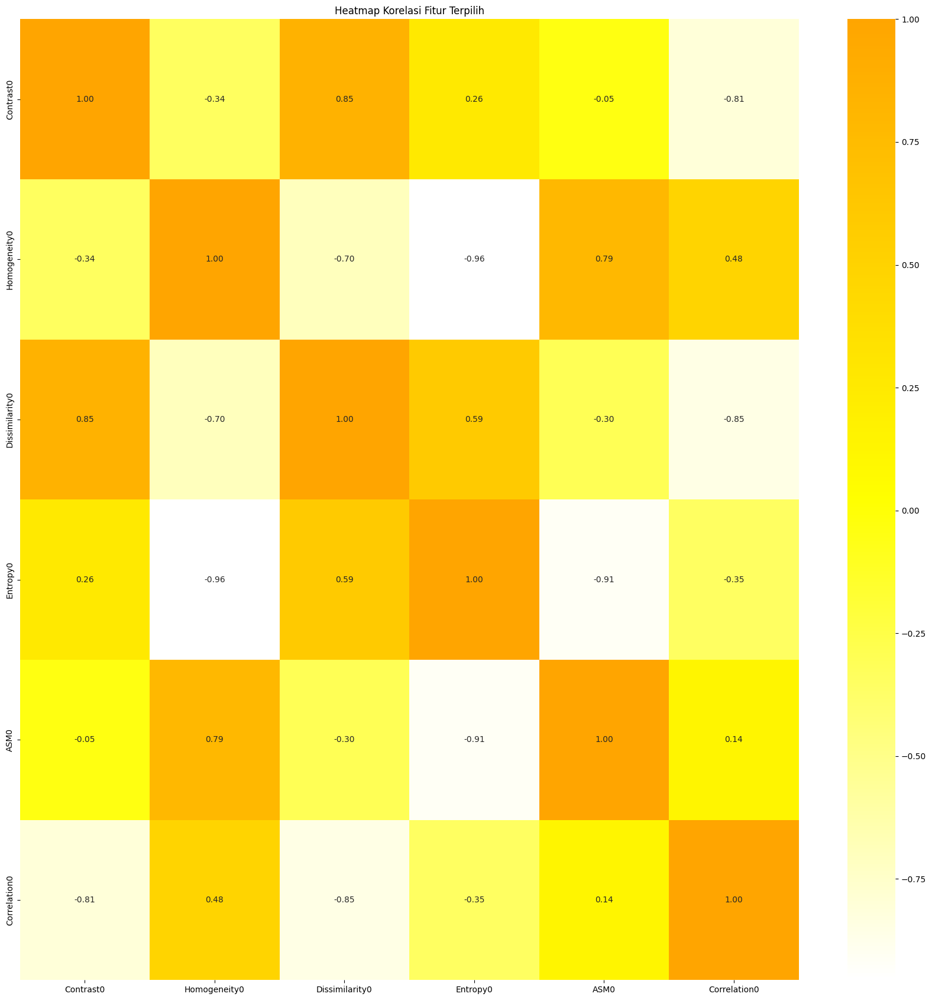

In [26]:
# Menghitung korelasi
correlation = hasilEkstrak.drop(columns=['Label','Filename']).corr()

# Menyaring fitur yang memiliki korelasi absolut lebih dari 0.95
threshold = 0.95
columns = np.full((correlation.shape[0],), True, dtype=bool)
for i in range(correlation.shape[0]):
    for j in range(i+1, correlation.shape[0]):
        if correlation.iloc[i,j] >= threshold:
            if columns[j]:
                columns[j] = False

select = hasilEkstrak.drop(columns=['Label','Filename']).columns[columns]
x_new = hasilEkstrak[select]
y = hasilEkstrak['Label']

print(f"Fitur sebelum seleksi: {len(hasilEkstrak.drop(columns=['Label','Filename']).columns)}")
print(f"Fitur setelah seleksi : {len(select)}")
print(f"Fitur yang dipilih    : {list(select)}")

mangga_cmap = LinearSegmentedColormap.from_list("mangga", ["white", "yellow", "orange"], N=256)

plt.figure(figsize=(17,17))
sns.heatmap(x_new.corr(), annot=True, cmap=mangga_cmap, fmt=".2f")
plt.title("Heatmap Korelasi Fitur Terpilih")
plt.tight_layout()
plt.show()

<h1>Splitting Data</h1>

In [27]:
X_train, X_test, y_train, y_test = train_test_split(
    x_new, y, test_size=0.3, random_state=42, stratify=y
)
print(f"Data dibagi 70% untuk training dan 30% data untuk testing")
print(f"Data training : {X_train.shape[0]} citra dengan {X_train.shape[1]} fitur")
print(f"Data testing  : {X_test.shape[0]} citra dengan {X_test.shape[1]} fitur")
print(f"Fitur yang digunakan: {list(X_train.columns)}")

Data dibagi 70% untuk training dan 30% data untuk testing
Data training : 280 citra dengan 6 fitur
Data testing  : 120 citra dengan 6 fitur
Fitur yang digunakan: ['Contrast0', 'Homogeneity0', 'Dissimilarity0', 'Entropy0', 'ASM0', 'Correlation0']


<p style="text-align: justify;">
Code di atas digunakan untuk membagi dataset fitur (x_new) dan label (y) menjadi data latih (training) dan data uji (testing) menggunakan fungsi train_test_split dari library scikit-learn. Proses ini merupakan tahap penting sebelum dilakukan klasifikasi dalam proyek Pengolahan Citra Digital (PCD), karena model perlu dilatih menggunakan sebagian data dan diuji menggunakan data yang belum pernah dilihat sebelumnya.

Parameter test_size=0.3 digunakan untuk mengalokasikan 30% data sebagai data uji dan 70% sebagai data latih. Sementara itu, parameter random_state=42 digunakan agar proses pembagian data bersifat konsisten (reproducible), sehingga hasil yang diperoleh tetap sama setiap kali kode dijalankan. Selain itu, parameter stratify=y digunakan untuk memastikan distribusi kelas pada data latih dan data uji tetap seimbang sesuai proporsi dataset asli.

Berdasarkan hasil pembagian, data latih terdiri dari 80% total data dengan jumlah 280 sampel, sedangkan data uji terdiri dari 120 sampel. Masing-masing sampel memiliki jumlah fitur yang sama, yaitu 5 fitur hasil seleksi sebelumnya. Dengan pembagian ini, model dapat dilatih dan dievaluasi secara lebih objektif terhadap kemampuan generalisasi pada data baru.
</p>Data dibagi 70% training dan 30% testing dengan `stratify=y` agar proporsi kelas tetap seimbang di kedua subset.

<h1>Normalisasi</h1>

In [28]:
X_test  = (X_test  - X_train.mean()) / X_train.std()
X_train = (X_train - X_train.mean()) / X_train.std()

print(f"X_train mean: {X_train.mean().mean():.4f}, std: {X_train.std().mean():.4f}")

X_train mean: -0.0000, std: 1.0000


<p style="text-align: justify;">
Code di atas digunakan untuk melakukan normalisasi data fitur pada dataset latih (X_train) dan dataset uji (X_test) menggunakan metode standardisasi (z-score normalization). Proses ini bertujuan untuk menyamakan skala setiap fitur agar memiliki nilai rata-rata mendekati nol dan standar deviasi satu, sehingga seluruh fitur berada pada skala yang sebanding.

Normalisasi dilakukan menggunakan nilai mean dan standar deviasi yang dihitung dari data latih (X_train). Hal ini penting untuk menghindari data leakage, yaitu kondisi ketika informasi dari data uji ikut mempengaruhi proses pelatihan model. Dengan demikian, evaluasi model pada data uji tetap objektif dan mencerminkan kemampuan generalisasi yang sebenarnya.

Setelah proses ini, data latih dan data uji memiliki distribusi skala yang seragam, sehingga dapat membantu meningkatkan stabilitas serta performa algoritma klasifikasi dalam proses pembelajaran.
</p>

<h1>Modeling</h1>

In [29]:
def generateClassificationReport(y_true, y_pred):
    print(classification_report(y_true, y_pred))
    print("Confusion Matrix:")
    print(confusion_matrix(y_true, y_pred))
    print('Accuracy:', accuracy_score(y_true, y_pred))

rf  = RandomForestClassifier(n_estimators=7, random_state=42)
svm = SVC(kernel='linear', random_state=42)
knn = KNeighborsClassifier(n_neighbors=10)

<p style="text-align: justify;">
Code di atas digunakan untuk mendefinisikan fungsi <code>generateClassificationReport</code> yang berfungsi untuk menampilkan hasil evaluasi model klasifikasi menggunakan <code>classification_report</code>, <code>confusion_matrix</code>, dan <code>accuracy_score</code> dari library scikit-learn. Fungsi ini digunakan untuk membandingkan nilai prediksi (<code>y_pred</code>) dengan nilai sebenarnya (<code>y_true</code>) sehingga dapat diperoleh gambaran menyeluruh mengenai performa model melalui metrik precision, recall, F1-score, serta akurasi.

Selain itu, pada bagian ini dilakukan inisialisasi tiga model klasifikasi yang digunakan dalam penelitian, yaitu Random Forest, Support Vector Machine (SVM), dan K-Nearest Neighbor (KNN). Random Forest Classifier menggunakan parameter <code>n_estimators=7</code> yang menunjukkan jumlah decision tree dalam model ensemble. Nilai ini diperoleh berdasarkan hasil beberapa percobaan konfigurasi jumlah pohon, di mana peningkatan jumlah tree bertujuan untuk meningkatkan stabilitas prediksi melalui mekanisme voting antar pohon. Pada nilai 7, model menunjukkan performa training yang sangat tinggi, namun masih terdapat penurunan pada data uji, yang mengindikasikan adanya kecenderungan overfitting meskipun tetap memberikan hasil testing yang relatif baik.

Pada model SVM digunakan kernel linear, yang dipilih karena berdasarkan hasil percobaan memberikan performa lebih baik dibandingkan kernel non-linear seperti RBF dan polynomial pada dataset ini. Hal ini menunjukkan bahwa fitur hasil ekstraksi GLCM memiliki kecenderungan pola yang cukup linear sehingga dapat dipisahkan secara efektif menggunakan hyperplane linear.

Sementara itu, pada model KNN digunakan parameter <code>n_neighbors=10</code> yang menentukan jumlah tetangga terdekat yang digunakan dalam proses klasifikasi. Nilai ini dipilih berdasarkan hasil eksperimen yang menunjukkan bahwa nilai tersebut memberikan keseimbangan terbaik antara sensitivitas terhadap noise dan kemampuan generalisasi model.
</p>

<h1>Train Random Forest Classifier</h1>

In [30]:
rf.fit(X_train, y_train)

print("=================== RANDOM FOREST ===================")
print("-------------------- Training Set -------------------")
y_pred = rf.predict(X_train)
generateClassificationReport(y_train, y_pred)

print("\n-------------------- Testing Set --------------------")
y_pred = rf.predict(X_test)
generateClassificationReport(y_test, y_pred)

=================== RANDOM FOREST ===================
-------------------- Training Set -------------------
              precision    recall  f1-score   support

  Alternaria       0.93      0.97      0.95        70
 Anthracnose       0.97      0.99      0.98        70
     Healthy       0.99      0.96      0.97        70
Stem and Rot       0.99      0.96      0.97        70

    accuracy                           0.97       280
   macro avg       0.97      0.97      0.97       280
weighted avg       0.97      0.97      0.97       280

Confusion Matrix:
[[68  0  1  1]
 [ 1 69  0  0]
 [ 2  1 67  0]
 [ 2  1  0 67]]
Accuracy: 0.9678571428571429

-------------------- Testing Set --------------------
              precision    recall  f1-score   support

  Alternaria       0.79      0.87      0.83        30
 Anthracnose       0.87      0.90      0.89        30
     Healthy       0.92      0.77      0.84        30
Stem and Rot       0.77      0.80      0.79        30

    accuracy          

<p style="text-align: justify;">
Code di atas digunakan untuk melakukan proses pelatihan model Random Forest menggunakan data latih (X_train dan y_train), kemudian mengevaluasi performa model pada data latih dan data uji. Proses dimulai dengan melakukan training menggunakan fungsi fit(), sehingga model dapat membangun sejumlah decision tree berdasarkan data fitur hasil ekstraksi GLCM.

Setelah proses pelatihan, model diuji terlebih dahulu pada data latih untuk melihat seberapa baik model mempelajari pola dari data yang telah diberikan. Selanjutnya, pengujian dilakukan pada data uji untuk mengevaluasi kemampuan generalisasi model terhadap data yang belum pernah dilihat sebelumnya.

Evaluasi dilakukan menggunakan fungsi generateClassificationReport yang menampilkan classification report (precision, recall, dan F1-score), confusion matrix, serta nilai akurasi. Berdasarkan hasil pengujian, model Random Forest menunjukkan performa yang sangat tinggi pada data latih dengan akurasi sekitar 0.97, namun terjadi penurunan pada data uji dengan akurasi sekitar 0.83. Selisih sekitar 14 poin persentase ini mengindikasikan bahwa model memiliki kecenderungan overfitting, yaitu sangat baik dalam mengenali pola pada data latih tetapi kurang optimal dalam melakukan generalisasi pada data baru.

Perbedaan performa ini menunjukkan bahwa meskipun Random Forest mampu membentuk pemisahan keputusan yang kompleks dari fitur GLCM, model tetap sensitif terhadap variasi data uji yang tidak sepenuhnya sama dengan pola pada data latih.
</p>

<h1>Train SVM Classifier</h1>

In [31]:
svm.fit(X_train, y_train)

print("======================== SVM ========================")
print("-------------------- Training Set -------------------")
y_pred = svm.predict(X_train)
generateClassificationReport(y_train, y_pred)

print("-------------------- Testing Set --------------------")
y_pred = svm.predict(X_test)
generateClassificationReport(y_test, y_pred)

======================== SVM ========================
-------------------- Training Set -------------------
              precision    recall  f1-score   support

  Alternaria       0.70      0.90      0.79        70
 Anthracnose       0.91      0.87      0.89        70
     Healthy       0.98      0.79      0.87        70
Stem and Rot       0.78      0.74      0.76        70

    accuracy                           0.82       280
   macro avg       0.84      0.82      0.83       280
weighted avg       0.84      0.82      0.83       280

Confusion Matrix:
[[63  0  1  6]
 [ 2 61  0  7]
 [12  1 55  2]
 [13  5  0 52]]
Accuracy: 0.825
-------------------- Testing Set --------------------
              precision    recall  f1-score   support

  Alternaria       0.74      0.87      0.80        30
 Anthracnose       0.90      0.93      0.92        30
     Healthy       0.91      0.70      0.79        30
Stem and Rot       0.81      0.83      0.82        30

    accuracy                        

<p style="text-align: justify;">
Code di atas digunakan untuk melakukan proses pelatihan model Support Vector Machine (SVM) menggunakan data latih (X_train dan y_train), kemudian mengevaluasi performa model pada data latih dan data uji. Proses dimulai dengan melakukan training menggunakan fungsi fit(), sehingga model SVM dapat mempelajari pola dari data fitur hasil ekstraksi GLCM.

Setelah proses pelatihan, model diuji terlebih dahulu pada data latih untuk melihat kemampuan model dalam mempelajari data yang sudah dikenali. Selanjutnya, model diuji kembali pada data uji untuk mengukur kemampuan generalisasi terhadap data yang belum pernah dilihat sebelumnya.

Evaluasi dilakukan menggunakan fungsi generateClassificationReport yang menampilkan classification report (precision, recall, F1-score), confusion matrix, serta nilai akurasi. Berdasarkan hasil pengujian, model SVM menunjukkan performa yang cukup baik pada data latih dengan akurasi sekitar 0.825, serta pada data uji dengan akurasi sekitar 0.833. Hal ini menunjukkan bahwa model memiliki kemampuan generalisasi yang cukup stabil tanpa indikasi overfitting yang signifikan.

Performa SVM ini juga dipengaruhi oleh penggunaan kernel linear yang sesuai dengan karakteristik fitur GLCM pada dataset, sehingga mampu memisahkan kelas dengan cukup efektif meskipun tidak sekompleks model ensemble seperti Random Forest.
</p>

<h1>Train KNN Classifier</h1>

In [32]:
knn.fit(X_train, y_train)

print("======================== KNN ========================")
print("-------------------- Training Set -------------------")
y_pred = knn.predict(X_train)
generateClassificationReport(y_train, y_pred)

print("-------------------- Testing Set --------------------")
y_pred = knn.predict(X_test)
generateClassificationReport(y_test, y_pred)

======================== KNN ========================
-------------------- Training Set -------------------
              precision    recall  f1-score   support

  Alternaria       0.73      0.86      0.79        70
 Anthracnose       0.89      0.80      0.84        70
     Healthy       0.95      0.76      0.84        70
Stem and Rot       0.72      0.81      0.77        70

    accuracy                           0.81       280
   macro avg       0.82      0.81      0.81       280
weighted avg       0.82      0.81      0.81       280

Confusion Matrix:
[[60  0  1  9]
 [ 4 56  2  8]
 [11  1 53  5]
 [ 7  6  0 57]]
Accuracy: 0.8071428571428572
-------------------- Testing Set --------------------
              precision    recall  f1-score   support

  Alternaria       0.71      0.90      0.79        30
 Anthracnose       0.93      0.83      0.88        30
     Healthy       0.95      0.67      0.78        30
Stem and Rot       0.74      0.83      0.78        30

    accuracy           

<p style="text-align: justify;">
Code di atas digunakan untuk melakukan proses pelatihan model K-Nearest Neighbor (KNN) menggunakan data latih (X_train dan y_train), kemudian mengevaluasi performa model pada data latih dan data uji. Proses dimulai dengan melakukan training menggunakan fungsi fit(), meskipun pada KNN tidak terjadi proses pembelajaran parameter seperti model lain, karena KNN bekerja dengan menyimpan seluruh data latih dan melakukan perhitungan jarak saat proses prediksi.

Setelah proses tersebut, model diuji terlebih dahulu pada data latih untuk melihat kemampuan model dalam mengenali pola dari data yang sudah ada, kemudian dilanjutkan dengan pengujian pada data uji untuk mengukur kemampuan generalisasi terhadap data baru.

Evaluasi dilakukan menggunakan fungsi generateClassificationReport yang menampilkan classification report (precision, recall, F1-score), confusion matrix, serta nilai akurasi. Berdasarkan hasil pengujian, model KNN menunjukkan performa yang cukup stabil dengan akurasi sekitar 0.807 pada data latih dan sekitar 0.808 pada data uji. Selisih yang sangat kecil antara kedua nilai ini menunjukkan bahwa model KNN mampu melakukan klasifikasi tanpa indikasi overfitting sama sekali, serta sangat konsisten dalam melakukan generalisasi pada dataset yang digunakan.
</p>

<h1>Evaluation With Confusion Matrix</h1>

<p style="text-align: justify;">
Code di bawah digunakan untuk membuat fungsi plot_confusion_matrix yang berfungsi untuk memvisualisasikan hasil evaluasi model klasifikasi dalam bentuk confusion matrix. Confusion matrix digunakan untuk melihat secara detail jumlah prediksi yang benar maupun salah pada setiap kelas, sehingga dapat memberikan gambaran yang lebih jelas mengenai performa model.

Pada fungsi ini, confusion matrix dihitung menggunakan confusion_matrix dari scikit-learn, kemudian ditampilkan menggunakan ConfusionMatrixDisplay dengan label kelas yang diurutkan berdasarkan y.unique(). Visualisasi menggunakan colormap khusus (mangga_cmap) agar tampilan lebih informatif dan mudah dibaca. Selain itu, dilakukan penyesuaian warna teks agar tetap terlihat jelas di atas warna heatmap.

Fungsi ini kemudian digunakan untuk menampilkan confusion matrix dari tiga model yang telah dilatih, yaitu Random Forest, Support Vector Machine (SVM), dan K-Nearest Neighbor (KNN). Dengan visualisasi ini, perbandingan performa antar model dapat dilihat secara lebih intuitif berdasarkan sebaran kesalahan klasifikasinya pada masing-masing kelas.
</p>

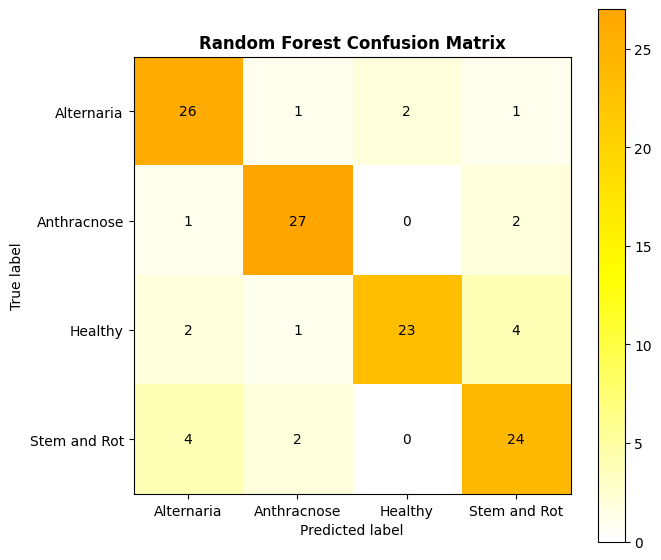

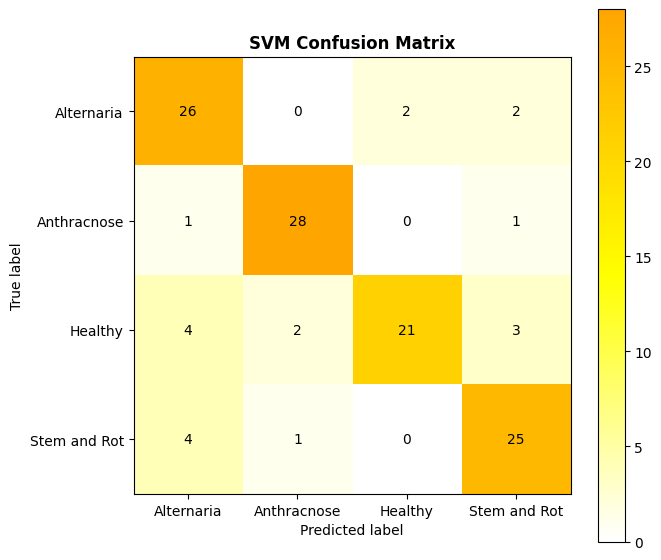

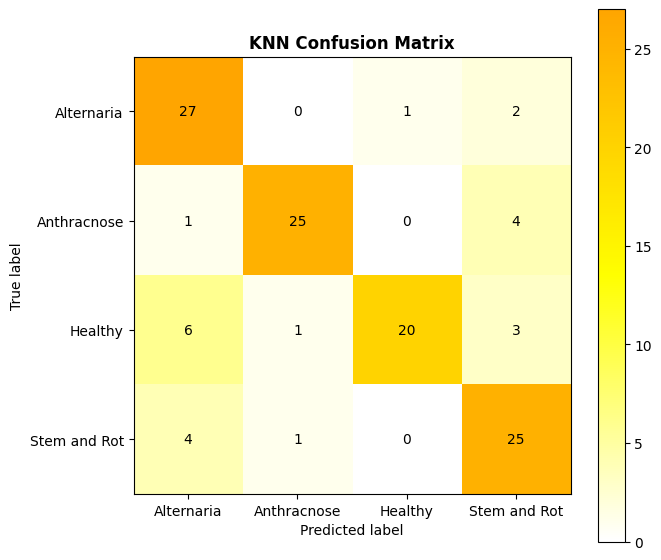

In [33]:
def plot_confusion_matrix(y_true, y_pred, title):
    cm = confusion_matrix(y_true, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=sorted(y.unique()))
    fig, ax = plt.subplots(figsize=(7, 6))
    disp.plot(cmap=mangga_cmap, ax=ax)
    
    for text in ax.texts:
        text.set_color('black')
    
    plt.title(title, fontsize=12, fontweight='bold')
    plt.tight_layout()
    plt.show()

plot_confusion_matrix(y_test, rf.predict(X_test),  "Random Forest Confusion Matrix")
plot_confusion_matrix(y_test, svm.predict(X_test), "SVM Confusion Matrix")
plot_confusion_matrix(y_test, knn.predict(X_test), "KNN Confusion Matrix")

In [34]:
print("=" * 40)
print("        RINGKASAN AKURASI MODEL")
print("=" * 40)
print(f"  Random Forest : {accuracy_score(y_test, rf.predict(X_test)):.4f}")
print(f"  SVM           : {accuracy_score(y_test, svm.predict(X_test)):.4f}")
print(f"  KNN           : {accuracy_score(y_test, knn.predict(X_test)):.4f}")
print("=" * 40)

        RINGKASAN AKURASI MODEL
  Random Forest : 0.8333
  SVM           : 0.8333
  KNN           : 0.8083


<p style="text-align: justify;">
Berdasarkan hasil ringkasan akurasi model, dapat dilihat bahwa ketiga model klasifikasi yang digunakan memiliki performa yang berbeda pada data uji. Random Forest memperoleh akurasi sebesar 0.833, SVM memperoleh akurasi sebesar 0.833, dan K-Nearest Neighbor (KNN) memperoleh akurasi sebesar 0.808.

Hasil ini menunjukkan bahwa Random Forest dan SVM memberikan performa terbaik dengan akurasi yang sama, sementara KNN sedikit tertinggal di bawah keduanya. Perbedaan ini mengindikasikan bahwa fitur hasil ekstraksi GLCM pada dataset ini memiliki struktur yang dapat dipisahkan dengan baik baik melalui pendekatan ensemble (Random Forest) maupun margin (SVM), sedangkan pendekatan berbasis jarak seperti KNN kurang optimal dalam memanfaatkan kedekatan antar sampel pada ruang fitur ini.

Random Forest unggul karena kombinasi banyak decision tree memungkinkan model menangkap pola pemisahan kelas yang kompleks dari fitur GLCM, meskipun perlu dicatat bahwa model ini menunjukkan gap akurasi yang besar terhadap data latih (0.97), sehingga performa testing-nya yang tinggi tetap perlu dicermati sebagai indikasi overfitting. SVM dengan kernel linear juga memberikan hasil yang sama baiknya, dengan akurasi training dan testing yang justru lebih stabil (0.825 dan 0.833), menunjukkan generalisasi yang konsisten tanpa indikasi overfitting.

Sementara itu, KNN menunjukkan performa yang sedikit lebih rendah pada baseline ini. Hal ini dapat mengindikasikan bahwa setelah seleksi fitur berdasarkan korelasi, struktur jarak antar sampel pada ruang fitur yang tersisa tidak sepenuhnya optimal untuk pendekatan KNN, sehingga model berbasis margin dan ensemble lebih mampu menangkap pola pemisahan kelas pada dataset ini.
</p>

<h1>Analisis Akhir</h1>

<p style="text-align: justify;">
Berdasarkan hasil keseluruhan percobaan klasifikasi menggunakan fitur GLCM tanpa preprocessing (baseline), dapat disimpulkan bahwa ketiga model yang digunakan, yaitu Random Forest, Support Vector Machine (SVM), dan K-Nearest Neighbor (KNN), menunjukkan performa yang relatif kompetitif dengan akurasi pada data uji berada pada kisaran 0.808 hingga 0.8333. Random Forest dan SVM memberikan hasil tertinggi dengan akurasi yang sama (0.8333), sementara KNN sedikit tertinggal (0.8083). Meski demikian, perbedaannya tidak terlalu signifikan, sehingga dapat dikatakan bahwa ketiga model masih mampu menangkap pola tekstur dari fitur yang diekstraksi. Perlu diketahui bahwa akurasi tinggi Random Forest pada data uji diiringi oleh gap yang besar terhadap akurasi data latihnya (0.97), yang mengindikasikan model ini paling rentan overfitting di antara ketiga model, sedangkan SVM menunjukkan generalisasi yang paling stabil.

Jika dilihat dari confusion matrix, tidak terdapat satu kelas yang benar-benar dominan paling mudah dikenali secara konsisten di semua model. Namun, terdapat pola menarik pada distribusi kesalahan klasifikasi. Kelas <b>Anthracnose</b> dan <b>Stem and Rot</b> cenderung memiliki tingkat recall yang lebih tinggi pada sebagian besar model, yang menunjukkan bahwa karakteristik teksturnya lebih mudah dipisahkan oleh fitur GLCM. Hal ini kemungkinan disebabkan oleh adanya bercak atau kerusakan yang lebih jelas sehingga memberikan perbedaan nilai pada fitur seperti contrast dan homogeneity.

Sebaliknya, kelas <b>Healthy</b> justru tidak selalu menjadi kelas yang paling mudah dikenali. Pada beberapa model, Healthy memiliki tingkat kesalahan yang cukup tinggi karena teksturnya yang cenderung homogen dan halus. Kondisi ini menyebabkan fitur GLCM dari kelas Healthy tidak memiliki karakteristik yang terlalu berbeda, sehingga model lebih sulit membedakannya secara konsisten.

Kelas <b>Alternaria</b> berada pada kondisi menengah, di mana sebagian data dapat dikenali dengan baik, namun masih terjadi kebingungan dengan kelas Anthracnose yang memiliki pola bercak yang mirip pada beberapa citra. Hal ini menunjukkan bahwa tantangan utama dalam dataset ini bukan hanya pada kualitas model, tetapi juga pada kemiripan pola tekstur antar kelas penyakit.

Secara keseluruhan, hasil baseline ini menunjukkan bahwa fitur GLCM sudah cukup informatif untuk melakukan klasifikasi, namun masih sangat dipengaruhi oleh kualitas citra asli. Variasi pencahayaan, kontras, dan noise pada dataset menyebabkan fitur tekstur tidak sepenuhnya merepresentasikan perbedaan kelas secara konsisten, sehingga diperlukan tahap preprocessing untuk menstandarkan kondisi citra.

</p>

<p style="text-align: justify;">
Percobaan baseline ini dilakukan tanpa preprocessing, sehingga citra masih mengandung variasi pencahayaan cukup tinggi. Kondisi ini membuat nilai fitur GLCM seperti contrast, homogeneity, dan entropy menjadi lebih sensitif terhadap perbedaan intensitas cahaya daripada perbedaan struktur penyakit itu sendiri. Akibatnya, model cenderung belajar dari variasi visual yang tidak relevan dengan kelas penyakit.

Dengan demikian, baseline ini berfungsi sebagai acuan awal untuk mengukur seberapa besar kontribusi tahap preprocessing.
</p>